In [102]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import cv2
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from PIL import Image
import plotly.offline as pyo
from IPython.display import display
import tensorflow as tf

2024-01-19 01:14:01.214386: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [517]:
path_to_directory = "/Users/deronmurphy/Dropbox/diabetes_prediction_dataset.csv"

df = pd.read_csv(path_to_directory)

Calculating the percentage of the data that is under the age of 13 and has no info about the smoking history


In [60]:
total = 0
j = 0
for k,i in df.iterrows():
    if i["smoking_history"] == "No Info":
        if (i['age']) < 13:
            total = total+1
            
        j = j+1


In [25]:
print(j/df.shape[0])
print(total/df.shape[0])

0.25458
0.0


Replacing all the values of 'No Info' for smoking history with the value 'never' for people under the age of 13.  

In [518]:
df.loc[(df['age'] < 13) & (df['smoking_history'] == "No Info"), 'smoking_history'] = 'never'
# df.loc[df['diabetes']== 0,'diabetes'] = 1
#,'not current','former','current','ever','no info'

In [519]:
(df['gender']).replace(to_replace ="Male",value =0,inplace = True)
(df['gender']).replace(to_replace ="Female",value =1,inplace = True)
(df['gender']).replace(to_replace ="Other",value =2,inplace = True)

(df['smoking_history']).replace(to_replace ="never",value =0,inplace = True)
(df['smoking_history']).replace(to_replace ="not current",value =1,inplace = True)
(df['smoking_history']).replace(to_replace ="former",value =2,inplace = True)
(df['smoking_history']).replace(to_replace ="current",value =3,inplace = True)
(df['smoking_history']).replace(to_replace ="ever",value =4,inplace = True)
(df['smoking_history']).replace(to_replace ="No Info",value =5,inplace = True)

In [520]:
print(df.dtypes)

gender                   int64
age                    float64
hypertension             int64
heart_disease            int64
smoking_history          int64
bmi                    float64
HbA1c_level            float64
blood_glucose_level      int64
diabetes                 int64
dtype: object


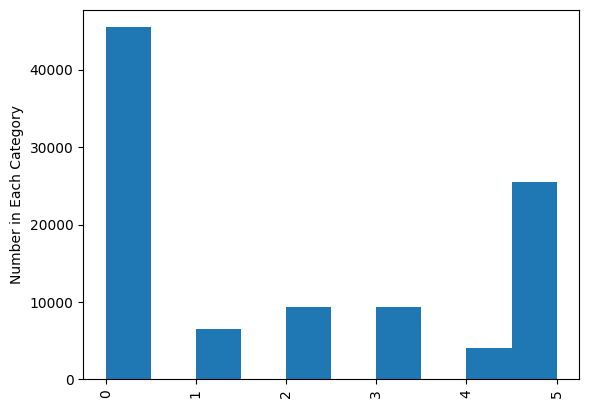

In [98]:
smoke_values = df['smoking_history'].value_counts()
# plt.bar(['never','not current','former','current','ever','no info'], [smoke_values['never'],smoke_values['not current'],smoke_values['former'],smoke_values['current'],smoke_values['ever'],smoke_values['No Info']])
plt.hist(df['smoking_history'])
plt.xticks(rotation=90)
plt.ylabel("Number in Each Category")
plt.show()

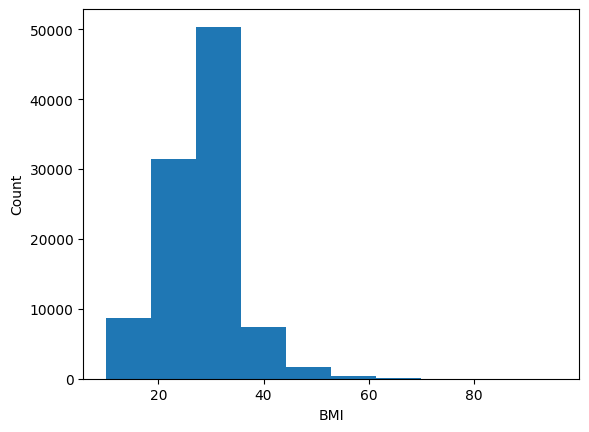

In [35]:

# Plot a histogram of the image sizes
bmi_values = df['bmi']

plt.hist(bmi_values)
plt.xlabel("BMI")
plt.ylabel("Count")
plt.show()

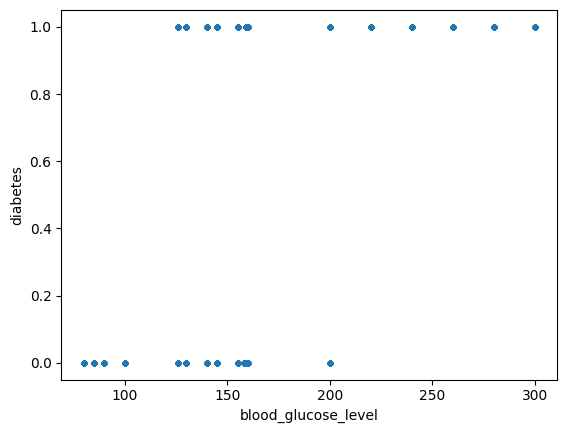

In [46]:
df.plot.scatter(x = 'blood_glucose_level', y = 'diabetes', s = 10); 


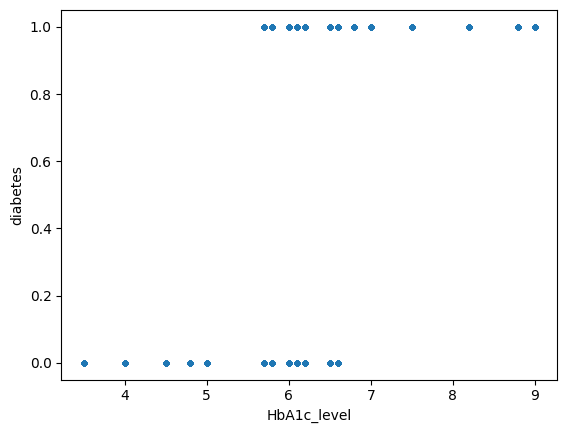

In [48]:
df.plot.scatter(x = 'HbA1c_level', y = 'diabetes', s = 10); 


In [547]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(df,test_size=0.2)

In [521]:
def A_vector(w,X,b): #having issues with the dimensions. 8 features makes the size of X (250,8). 
    ret = []
    # for x in X:
    #     x = tf.reshape(x,[1,x.shape[0]])
    #     wT = np.squeeze(np.asarray(w.T))
    #     # print(x[0])
    #     x_x = np.squeeze(np.asarray(x))
    #     a = np.dot(wT,x_x[0]) + b
        
    #     temp = log_regression(a)
    #     ret.append(temp)
    # ret = tf.convert_to_tensor(ret)
    # ret = np.squeeze(ret)
    # print(ret.shape)
    a = np.dot(w.T,X) + b
    return log_regression(a)
def log_regression(a):
    return 1 /(1+np.exp(-a))

def cost_func(n,Y,A):
    p1 = Y * np.log(A)
    p2 =  (1-Y) * (np.log(1-A))
    # for i in range(p2.shape[0]):
    #     for j in range(p2.shape[1]):
    #         if tf.math.is_nan(p2[i][j]):
    #             p2[i][j] = 0
    p2 = tf.where(tf.math.is_nan(p2), 0, p2)
        
    print(p2)
    return -1/n * np.sum(p1+p2)
def dw_func(X,A,Y,n):
    # Y = tf.reshape(Y, [1,Y.shape[0]])
    Y_y = np.squeeze(np.asarray(Y))
    A_a =np.squeeze(np.asarray(A))
    x_x = np.squeeze(np.asarray(X))
    # print(Y_y.shape)
    # print(A_a.shape)
    # print(x_x.shape)
    return np.dot(X, (A-Y).T)/n
def db_func(A,Y,n):
    Y_y = np.squeeze(np.asarray(Y))
    A_a =np.squeeze(np.asarray(A))

    return np.sum(A-Y)/n



Next must update weights using gradient descent rule

In [532]:
w =np.zeros(shape = (8,1))
print(w)
b = 0
print(b)

[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
0


In [461]:
def eval_gradient(batch,w,b,n):
    Y = batch['diabetes']
    Y = Y.T
    X = batch.copy()
    X.drop('diabetes', axis=1, inplace=True)
    X = X.T
    X = tf.convert_to_tensor(X)
    Y = tf.convert_to_tensor(Y)
    # print(X.shape)
    A = A_vector(w,X,b)
    cost = cost_func(n=n,Y=Y,A=A)
    dw = dw_func(X,A,Y,n)
    db = db_func(A,Y,n)
    return (cost, dw,db)

In [159]:
def get_batches(data,batch_size):
    result = []
    for i in range(0, len(data), batch_size):
        chunk = df.iloc[i:i + batch_size]
        result.append(chunk)
    return result

In [447]:
def minibatch_gradient_descent_update(w,b,lr,nb_epochs,data,n):
    for i in range(nb_epochs):
        shuffled_data = data.reindex(np.random.permutation(data.index))
        for batch in get_batches (shuffled_data , batch_size =n):
            cost,dw, db = eval_gradient(batch=batch,w=w,b=b,n=n)
            # print(dw)
            # print(db)
            w = w -(lr* dw)
            b = b -(lr* db)
            # print(b)
    return cost, w,b


In [453]:
tf.experimental.numpy.experimental_enable_numpy_behavior()
np.seterr(divide = 'ignore')


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [501]:
def batch_gradient_descent_update(w,b,lr,nb_epochs,data,n):
    for i in range(nb_epochs):
        dw, db = eval_gradient(A,data,w,b,n)
        w = w -(lr* dw)
        b = b -(lr* db)


In [541]:
lr = 0.01
nb_epochs = 10
n = 250
cost, w, b = minibatch_gradient_descent_update(w,b,lr,nb_epochs,train,n)


tf.Tensor(
[[-1.78306710e+00 -1.06458906e-08 -2.49542441e-05 -9.18823675e-05
  -4.99486517e+00 -2.94635528e-09 -0.00000000e+00 -2.66709856e-04
  -4.45091009e-07 -2.82074006e-07 -8.14414566e-06  0.00000000e+00
  -1.88613158e-06 -3.12150410e+00 -2.63639756e-03 -3.07277734e-04
  -1.60206452e-06 -6.06860988e-03 -8.15885138e-10 -1.42396320e-05
  -2.54662957e-12 -1.24134842e-06 -2.34794010e-01 -1.57873967e-03
  -1.31506666e-02 -3.19541594e-09 -0.00000000e+00 -2.59317975e-08
  -8.17736790e-03 -2.11203696e-03 -4.87535397e-06 -4.10433244e-05
  -7.94765378e-05 -4.97756947e-06 -1.14649089e-01 -6.21588170e-05
  -4.11653088e-08 -1.01865664e-01 -0.00000000e+00 -1.11022302e-16
  -0.00000000e+00 -7.94115199e-09 -2.63373277e-02 -3.18750517e-05
  -4.88055588e-04 -4.03811648e-05 -1.15060492e-04 -6.34068151e+00
  -3.25287276e-05 -7.60647112e-07 -1.59345694e-02 -7.91339968e-07
  -4.51370324e-06 -0.00000000e+00 -9.88149077e-03 -0.00000000e+00
  -1.22382786e-08 -1.25707203e-04 -1.67543435e-05  0.00000000e+00

In [539]:
print(cost)

2.633304873015134


In [ ]:
def accuracy(test_set):
     Y = batch['diabetes']
     Y = Y.T
     X = batch.copy()
     X.drop('diabetes', axis=1, inplace=True)
     X = X.T
     X = tf.convert_to_tensor(X)
     Y = tf.convert_to_tensor(Y)
     num = 0
     correct= 0
     for i in X:
          y_pred = A_vector(w,example_data,b)
          print(y_pred)
          pred = act_func(y_pred)
          if(pred == Y[i]):
               correct = correct+1
          num = num+1
     return correct/ num

In [499]:
def act_func(n):
    if (n <= .5):
        return 0

    if (n > .5):
        return 1

Now using packages

In [544]:

print(w)
example_data = [1,44,0,0,0,19.31,6.5,200]
print(len(example_data))
y_pred = A_vector(w,example_data,b)
print(y_pred)
print(act_func(y_pred))




[[-1.36475078]
 [ 0.25103384]
 [ 0.83173171]
 [ 0.50048053]
 [-1.56536424]
 [-0.9781299 ]
 [-0.36020767]
 [ 0.06336472]]
8
[0.35575967]
0


In [ ]:
print(accuracy())